In [1]:
!pip install timm
!pip install transformers
!pip install pytesseract
!pip install pillow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 39.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 21.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 54.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 73.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 99.4 MB/s eta 0:00:00


In [2]:
import torch
from transformers import AutoImageProcessor, TableTransformerForObjectDetection
import pytesseract
from PIL import Image

In [110]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [170]:
from google.colab.patches import cv2_imshow
import cv2

In [3]:
pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'


In [181]:
file_path = r'/content/drive/MyDrive/213950.jpg'

Получилось как перевести изображение в черно-белый формат, но до конце не ясно, как его дальше использовать

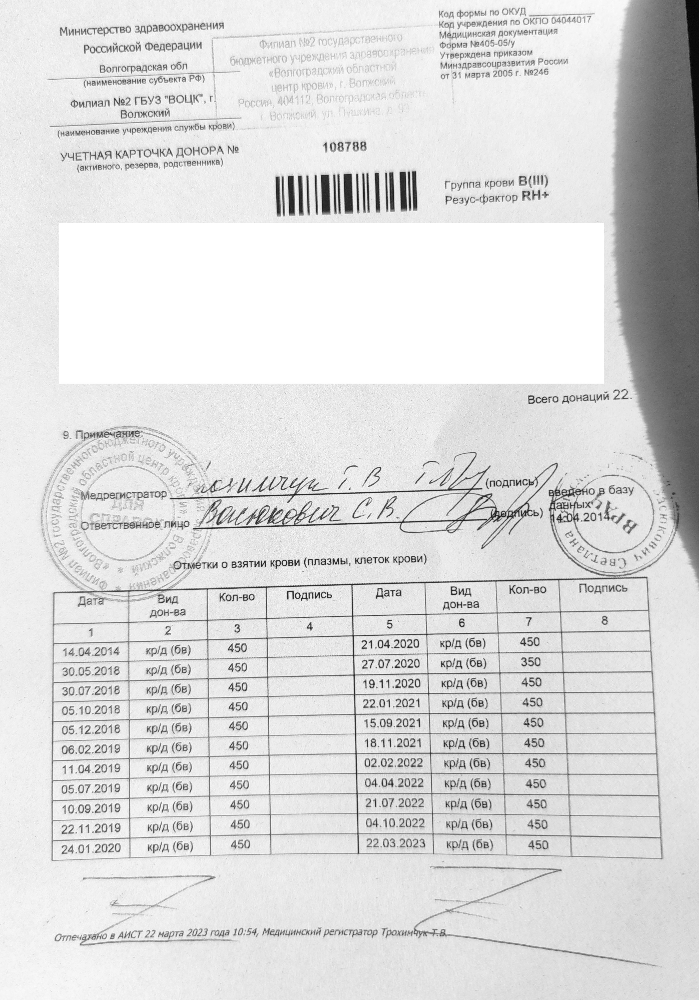

In [188]:
src = cv2.imread(file_path)
image = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY )
cv2_imshow(image)

Тут получаем рамки таблицы, но это работает не на всех изображениях

In [192]:

image = Image.open(file_path).convert("RGB")
image_processor = AutoImageProcessor.from_pretrained("microsoft/table-transformer-detection")
model = TableTransformerForObjectDetection.from_pretrained("microsoft/table-transformer-detection")

inputs = image_processor(images=image, return_tensors="pt")
outputs = model(**inputs)

target_sizes = torch.tensor([image.size[::-1]])
results = image_processor.post_process_object_detection(outputs, threshold=0.9, target_sizes=target_sizes)[
    0
]



Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


In [184]:
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    print(
        f"Detected {model.config.id2label[label.item()]} with confidence "
        f"{round(score.item(), 3)} at location {box}"
    )

Detected table with confidence 0.974 at location [297.1, 2885.1, 3036.71, 4174.5]


In [185]:
box

[297.1, 2885.1, 3036.71, 4174.5]

Обрезаем таблицу

In [186]:
image = image.crop(set(box))

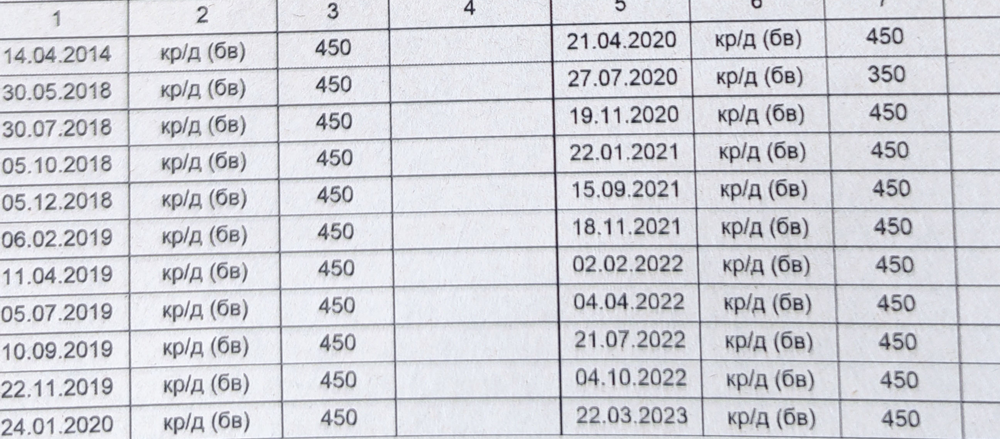

In [187]:
image